## Liquid Crystal Analysis

Chemoresponsive liquid crystals (LCs) have potential to serve as sensors for gas contaminants. LCs can elicit different, visible chemical repsonses when exposed to different chemical enivronments. We are interested in being able to identify the contaminant concentration based on an image of the LCs. In the work by [Jiang et al.](https://doi.org/10.26434/chemrxiv-2023-fjcxd-v2), they showed how the topology of the liquid crystal data/images can be used as features within machine learning tools. 

In this notebook, we will show how PlasmoData can be used to extract features from data. We use the data provided by [Jiang et al.](https://doi.org/10.26434/chemrxiv-2023-fjcxd-v2) for this procedure. The data has already been processed into a format readable to PlasmoData (the images have been converted to 3 dimensional arrays, where the first two dimensions are the image's pixel dimensions, and the third dimension is the RGB channels). 

If you have pulled this repository from the zavalab github, these datasets are contained in a zip file and will have to be unpacked. 

### LC Data Overview

The LC images from [Jiang et al.](https://doi.org/10.26434/chemrxiv-2023-fjcxd-v2) are from four different concentrations of $SO_2$: 0.5 ppm, 1.0 ppm, 2.0 ppm, and 5.0 ppm. Example images from each class are shown below. 

![4classes](4class_images.png)

### Extracting Topological Features

We will use the Euler Characteristic (EC) curve as a topological feature for training linear support vector machines (SVMs). We will get an EC curve for all three channels of the colored images and then concantenate these three curves together to get a single vector. This final concatenated vector will be used to train the SVMs.

In [10]:
using PlasmoData, JLD, MLUtils, LIBSVM, Random, Statistics

### Construct matrices as graphs and get EC curves ###

# Load in the SO2 data; so2_data is size (288, 134, 134, 3)
so2_data = load((@__DIR__)*"/so2_data.jld")["data"]
so2_classes = load((@__DIR__)*"/so2_classes.jld")["classes"]

# Define threshold range for each EC curve
thresh = 0:.005:1

# Define a matrix for the EC curves; EC curves will be concatenated
so2_ECs = Array{Float64, 2}(undef, (length(thresh)*3, 288))

for i in 1:288
    # Build a graph from a 3-D array (134 x 134 x 3)
    mat_graph = matrix_to_graph(so2_data[i, :, :, :], diagonal = true)
    for j in 1:3
        # Iterate through each channel and concatenate the EC curve
        range_bounds = (1 + (j - 1) * length(thresh)):(j * length(thresh))
        so2_ECs[range_bounds, i] = run_EC_on_nodes(mat_graph, thresh, attribute = "weight$j", scale = false)
    end
end

We will use the package LIBSVM for our SVMs. 

In [11]:
### Perform 5 fold CV with SVMs on EC data ###

Random.seed!(10)
# shuffle data
Xs, ys = shuffleobs((so2_ECs, so2_classes))

# define a function for calculating accuracy
function get_accuracy(yhat, ytest)
    num_errors = 0
    for i in 1:length(yhat)
        if yhat[i] != ytest[i]
            num_errors += 1
        end
    end
    return 1 - num_errors/length(yhat)

end

# Perform 5-fold CV
accuracy_values = []
for (train_data, val_data) in kfolds((Xs, ys); k = 5)
    model = svmtrain(train_data[1], train_data[2], kernel = Kernel.Linear)
    yhat, decision_values = svmpredict(model, val_data[1])

    accuracy = get_accuracy(yhat, val_data[2])
    push!(accuracy_values, accuracy)
end

println("Accuracy of each iteration of 5-fold CV: ", accuracy_values)
println("Average Accuracy: ", mean(accuracy_values))

Accuracy of each iteration of 5-fold CV: Any[0.9482758620689655, 0.9310344827586207, 0.9827586206896551, 0.9298245614035088, 0.9473684210526316]
Average Accuracy: 0.9478523895946764


Overall, just using the EC curves for each image yields high accuracy (~95%). 

The EC curves can also be visualized, as shown below. While the three sets of EC curves are similar, some minor differences can be seen.

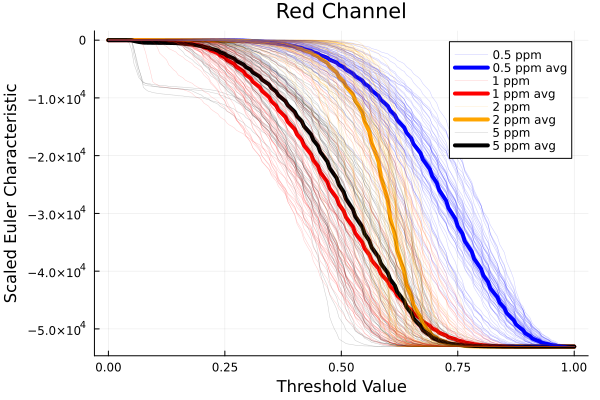

In [12]:
using Plots

plt_range = 1:201

so21_avg = mean(so2_ECs[plt_range, 1:72], dims = 2)
so22_avg = mean(so2_ECs[plt_range, 73:144], dims = 2)
so23_avg = mean(so2_ECs[plt_range, 145:216], dims = 2)
so24_avg = mean(so2_ECs[plt_range, 217:288], dims = 2)

plt3 = plot(thresh, so2_ECs[plt_range, 1], color = :blue, linealpha = .2, linewidth = .5, label = "0.5 ppm")
plot!(plt3, thresh, so21_avg[:], color = :blue, linewidth = 4, label = "0.5 ppm avg")
plot!(plt3, thresh, so2_ECs[plt_range, 73], color = :red, linealpha = .2, linewidth = .5, label = "1 ppm")
plot!(plt3, thresh, so22_avg[:], color = :red, linewidth = 4, label = "1 ppm avg")
plot!(plt3, thresh, so2_ECs[plt_range, 217], color = :orange, linealpha = .2, linewidth = .5, label = "2 ppm")
plot!(plt3, thresh, so24_avg[:], color = :orange, linewidth = 4, label = "2 ppm avg")
plot!(plt3, thresh, so2_ECs[plt_range, 145], color = :black, linealpha = .2, linewidth = .5, label = "5 ppm")
plot!(plt3, thresh, so23_avg[:], color = :black, linewidth = 4, label = "5 ppm avg")

for i in 2:72
    plot!(plt3, thresh, so2_ECs[plt_range, i], color = :blue, label = :none, linealpha = .2, linewidth = .5)
    plot!(plt3, thresh, so2_ECs[plt_range, i + 72], color = :red, label = :none, linealpha = .2, linewidth = .5)
    plot!(plt3, thresh, so2_ECs[plt_range, i + 216], color = :orange, label = :none, linealpha = .2, linewidth = .5)
    plot!(plt3, thresh, so2_ECs[plt_range, i + 144], color = :black, label = :none, linealpha = .2, linewidth = .5)
end
title!("Red Channel")
xlabel!("Threshold Value")
ylabel!("Scaled Euler Characteristic")
#savefig("4class_LC_ECs.png")
display(plt3)

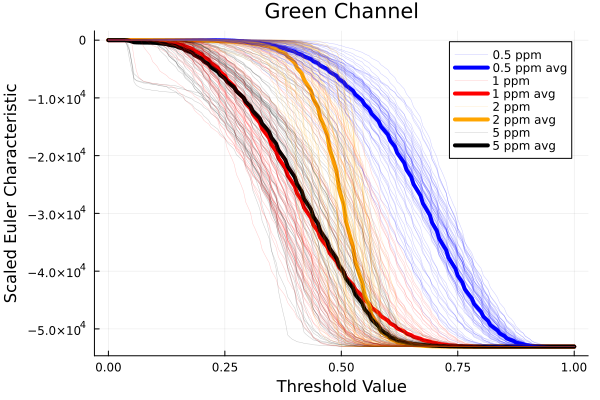

In [13]:
using Plots

plt_range = 202:402

so21_avg = mean(so2_ECs[plt_range, 1:72], dims = 2)
so22_avg = mean(so2_ECs[plt_range, 73:144], dims = 2)
so23_avg = mean(so2_ECs[plt_range, 145:216], dims = 2)
so24_avg = mean(so2_ECs[plt_range, 217:288], dims = 2)

plt3 = plot(thresh, so2_ECs[plt_range, 1], color = :blue, linealpha = .2, linewidth = .5, label = "0.5 ppm")
plot!(plt3, thresh, so21_avg[:], color = :blue, linewidth = 4, label = "0.5 ppm avg")
plot!(plt3, thresh, so2_ECs[plt_range, 73], color = :red, linealpha = .2, linewidth = .5, label = "1 ppm")
plot!(plt3, thresh, so22_avg[:], color = :red, linewidth = 4, label = "1 ppm avg")
plot!(plt3, thresh, so2_ECs[plt_range, 217], color = :orange, linealpha = .2, linewidth = .5, label = "2 ppm")
plot!(plt3, thresh, so24_avg[:], color = :orange, linewidth = 4, label = "2 ppm avg")
plot!(plt3, thresh, so2_ECs[plt_range, 145], color = :black, linealpha = .2, linewidth = .5, label = "5 ppm")
plot!(plt3, thresh, so23_avg[:], color = :black, linewidth = 4, label = "5 ppm avg")

for i in 2:72
    plot!(plt3, thresh, so2_ECs[plt_range, i], color = :blue, label = :none, linealpha = .2, linewidth = .5)
    plot!(plt3, thresh, so2_ECs[plt_range, i + 72], color = :red, label = :none, linealpha = .2, linewidth = .5)
    plot!(plt3, thresh, so2_ECs[plt_range, i + 216], color = :orange, label = :none, linealpha = .2, linewidth = .5)
    plot!(plt3, thresh, so2_ECs[plt_range, i + 144], color = :black, label = :none, linealpha = .2, linewidth = .5)
end
title!("Green Channel")
xlabel!("Threshold Value")
ylabel!("Scaled Euler Characteristic")
#savefig("4class_LC_ECs.png")
display(plt3)

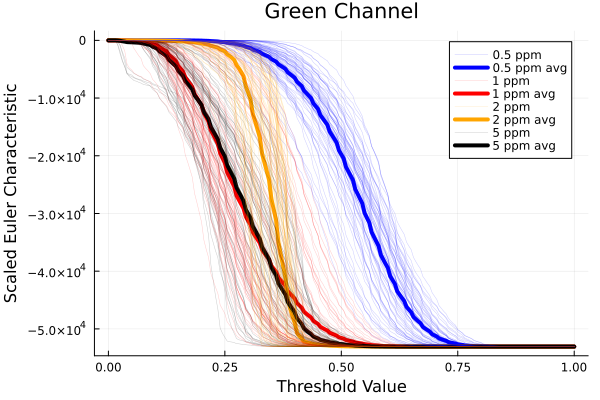

In [14]:
using Plots

plt_range = 403:603

so21_avg = mean(so2_ECs[plt_range, 1:72], dims = 2)
so22_avg = mean(so2_ECs[plt_range, 73:144], dims = 2)
so23_avg = mean(so2_ECs[plt_range, 145:216], dims = 2)
so24_avg = mean(so2_ECs[plt_range, 217:288], dims = 2)

plt3 = plot(thresh, so2_ECs[plt_range, 1], color = :blue, linealpha = .2, linewidth = .5, label = "0.5 ppm")
plot!(plt3, thresh, so21_avg[:], color = :blue, linewidth = 4, label = "0.5 ppm avg")
plot!(plt3, thresh, so2_ECs[plt_range, 73], color = :red, linealpha = .2, linewidth = .5, label = "1 ppm")
plot!(plt3, thresh, so22_avg[:], color = :red, linewidth = 4, label = "1 ppm avg")
plot!(plt3, thresh, so2_ECs[plt_range, 217], color = :orange, linealpha = .2, linewidth = .5, label = "2 ppm")
plot!(plt3, thresh, so24_avg[:], color = :orange, linewidth = 4, label = "2 ppm avg")
plot!(plt3, thresh, so2_ECs[plt_range, 145], color = :black, linealpha = .2, linewidth = .5, label = "5 ppm")
plot!(plt3, thresh, so23_avg[:], color = :black, linewidth = 4, label = "5 ppm avg")

for i in 2:72
    plot!(plt3, thresh, so2_ECs[plt_range, i], color = :blue, label = :none, linealpha = .2, linewidth = .5)
    plot!(plt3, thresh, so2_ECs[plt_range, i + 72], color = :red, label = :none, linealpha = .2, linewidth = .5)
    plot!(plt3, thresh, so2_ECs[plt_range, i + 216], color = :orange, label = :none, linealpha = .2, linewidth = .5)
    plot!(plt3, thresh, so2_ECs[plt_range, i + 144], color = :black, label = :none, linealpha = .2, linewidth = .5)
end
title!("Green Channel")
xlabel!("Threshold Value")
ylabel!("Scaled Euler Characteristic")
#savefig("4class_LC_ECs.png")
display(plt3)

### Visualizing Different Filtration Thresholds

In addition to looking at the shapes of the different EC curves, we can also consider what the filtrations look like. We will just show a few of these filtrations. We will look at the differences between 0.5 ppm and 2.0 ppm in the red channel.

In [15]:
using DataGraphPlots

image1_class1 = so2_data[1, :, :, :]
image2_class4 = so2_data[217, :, :, :];

In [16]:
image1_graph = matrix_to_graph(image1_class1, attributes = ["Red", "Green", "Blue"]);
image2_graph = matrix_to_graph(image2_class4, attributes = ["Red", "Green", "Blue"]);

set_matrix_node_positions!(image1_graph, image1_class1)
set_matrix_node_positions!(image2_graph, image2_class4)

true

Image 1 (0.5 ppm), Red Channel Filtration, threshold = 0.8


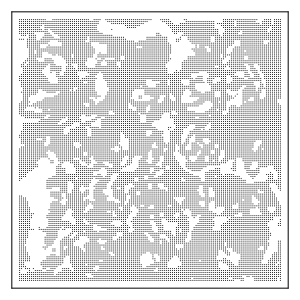

Image 2 (2.0 ppm), Red Channel Filtration, threshold = 0.8


In [28]:
fg1_1r = filter_nodes(image1_graph, .8, "Red")

println("Image 1 (0.5 ppm), Red Channel Filtration, threshold = 0.8")
plot_graph(
    fg1_1r,
    nodesize = .6,
    xdim = 300,
    ydim = 300,
    plot_edges = false
)

fg2_1r = filter_nodes(image2_graph, .8, "Red")

println("Image 2 (2.0 ppm), Red Channel Filtration, threshold = 0.8")
plot_graph(
    fg2_1r,
    nodesize = .6,
    xdim = 300,
    ydim = 300,
    plot_edges = false
);


Image 1 (0.5 ppm), Red Channel Filtration, threshold = 0.7


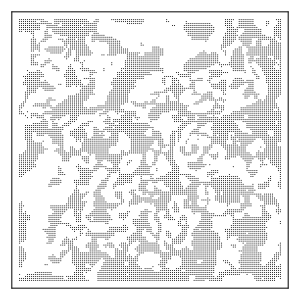

Image 2 (2.0 ppm), Red Channel Filtration, threshold = 0.7


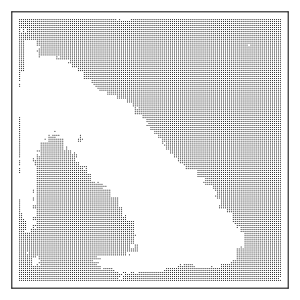

In [29]:
fg1_2r = filter_nodes(image1_graph, .7, "Red")

println("Image 1 (0.5 ppm), Red Channel Filtration, threshold = 0.7")
plot_graph(
    fg1_2r,
    nodesize = .6,
    xdim = 300,
    ydim = 300,
    plot_edges = false
)

fg2_2r = filter_nodes(image2_graph, .7, "Red")
println("Image 2 (2.0 ppm), Red Channel Filtration, threshold = 0.7")

plot_graph(
    fg2_2r,
    nodesize = .6,
    xdim = 300,
    ydim = 300,
    plot_edges = false
);


Image 1 (0.5 ppm), Red Channel Filtration, threshold = 0.6


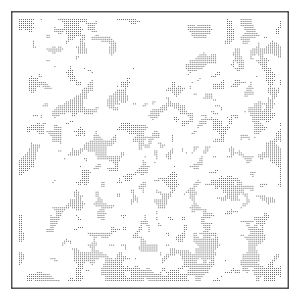

Image 2 (2.0 ppm), Red Channel Filtration, threshold = 0.6


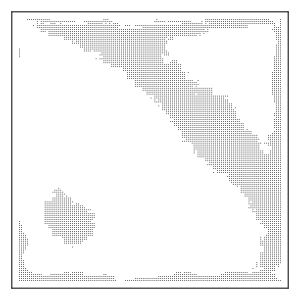

In [30]:
fg1_3r = filter_nodes(image1_graph, .6, "Red")

println("Image 1 (0.5 ppm), Red Channel Filtration, threshold = 0.6")
plot_graph(
    fg1_3r,
    nodesize = .5,
    xdim = 300,
    ydim = 300,
    plot_edges = false
)

fg2_3r = filter_nodes(image2_graph, .6, "Red")

println("Image 2 (2.0 ppm), Red Channel Filtration, threshold = 0.6")
plot_graph(
    fg2_3r,
    nodesize = .5,
    xdim = 300,
    ydim = 300,
    plot_edges = false
);


The images from the two classes reveal different appearances during the filtration. For example, the image from the 0.5 ppm class shows scattered, small connected components while the 2.0 ppm class has much larger connected components. 